In [34]:
using BraidGroup

In [67]:
σ = braid.(1:10);

In [68]:
a=σ[1]*σ[2]*σ[1]

Braid([1, 2, 1])

In [69]:
b=σ[2]*σ[1]*σ[2]

Braid([2, 1, 2])

In [70]:
reduced(a*b^-1)

ε

In [71]:
a=σ[2]*σ[3]^-3*σ[3]^2*σ[4]^10

Braid([2, -3, -3, -3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4])

In [72]:
reduced(a)

Braid([2, -3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4])

In [73]:
reduced(a*a^-1)

ε

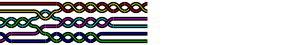

In [113]:
a = prod(braid(rand(1:5))^rand(-5:5) for i=1:10)
composed(a, compressed=true)

In [114]:
BraidGroup.nexthandle(a)

(6, 7)

In [119]:
@code_warntype reduced!(a, 6, 7)

MethodInstance for BraidGroup.reduced!(::Braid, ::Int64, ::Int64)
  from reduced!(a::Braid, i::Int64, j::Int64) in BraidGroup at /home/ab/src/BraidGroup/src/reduction.jl:72
Arguments
  #self#::Core.Const(BraidGroup.reduced!)
  a::Braid
  i::Int64
  j::Int64
Locals
  #141::BraidGroup.var"#141#144"{Braid, BraidGroup.var"#replace#143"{Int64, Int64, Int64}}
  #140::BraidGroup.var"#140#142"{Int64}
  @_7::Int64
  @_8::Int64
  replace::BraidGroup.var"#replace#143"{Int64, Int64, Int64}
  rnew::UnitRange{Int64}
  newlen::Int64
  oldlen::Int64
  numk::Int64
  sj::Int64
  xj::Int64
  si::Int64
  xi::Int64
  @_18::SubArray{Int64, 1, Vector{Int64}, Tuple{UnitRange{Int64}}, true}
  @_19::SubArray{Int64, 1, Vector{Int64}, Tuple{UnitRange{Int64}}, true}
  @_20::SubArray{Int64, 1, Vector{Int64}, Tuple{UnitRange{Int64}}, true}
  @_21::SubArray{Int64, 1, Vector{Int64}, Tuple{UnitRange{Int64}}, true}
  @_22::SubArray{Int64, 1, Vector{Int64}, Tuple{UnitRange{Int64}}, true}
Body::Braid
1 ──        Core.Newv

In [112]:
@code_warntype(reduced!(a))

MethodInstance for BraidGroup.reduced!(::Braid)
  from reduced!(a::Braid) in BraidGroup at /home/ab/src/BraidGroup/src/reduction.jl:103
Arguments
  #self#::Core.Const(BraidGroup.reduced!)
  a::Braid
Locals
  @_3::Int64
  j::Int64
  i::Int64
  last::Vector{Int64}
Body::Braid
1 ─ %1  = BraidGroup.width(a)::Int64
│         (last = BraidGroup.fill(0, %1))
└──       BraidGroup.freesimplify!(a)
2 ┄ %4  = BraidGroup.nexthandle(a, last)::Tuple{Int64, Int64}
│   %5  = Base.indexed_iterate(%4, 1)::Core.PartialStruct(Tuple{Int64, Int64}, Any[Int64, Core.Const(2)])
│         (i = Core.getfield(%5, 1))
│         (@_3 = Core.getfield(%5, 2))
│   %8  = Base.indexed_iterate(%4, 2, @_3::Core.Const(2))::Core.PartialStruct(Tuple{Int64, Int64}, Any[Int64, Core.Const(3)])
│         (j = Core.getfield(%8, 1))
│   %10 = Core.tuple(0, 0)::Core.Const((0, 0))
│   %11 = (%4 != %10)::Bool
└──       goto #4 if not %11
3 ─       BraidGroup.reduced!(a, i, j)
└──       goto #2
4 ─       return a



In [76]:
reduced!(a);

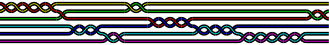

In [93]:
composed(a, compressed=false)

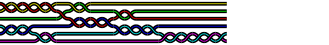

In [100]:
composed(a; compressed=true)

In [101]:
a

Braid([1, 1, 1, 1, 1, 2, -4, -4, -4, 5  …  4, 4, -5, -5, -5, -5, -5, -5, 2, 2])

In [102]:
using BenchmarkTools
y = copy(a)
@btime reduced!(y) setup=(y = copy(a));

  333.071 ns (2 allocations: 128 bytes)


In [103]:
b = copy(a)
reduced!(b)

Braid([1, 1, 1, 1, 1, 2, -4, -4, -4, 5  …  4, 4, -5, -5, -5, -5, -5, -5, 2, 2])

In [104]:
a == b

true

In [105]:
@btime BraidGroup.reduced_slow($a);

  363.446 ns (2 allocations: 400 bytes)


In [106]:
b = reduced(a);

In [107]:
b = prod(braid(rand(1:5))^rand(-2:2) for i=1:40)

Braid([4, 4, -5, -1, -1, 5, 5, 4, 4, 4  …  2, 3, 3, 5, 5, 2, -5, 2, -3, -3])

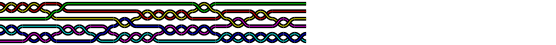

In [108]:
using Cairo, Fontconfig
display("image/png", composed(b))

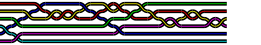

In [109]:
display("image/png", composed(reduced(b)))

In [110]:
import Compose;
compose()

LoadError: MethodError: no method matching compose()
[0mClosest candidates are:
[0m  compose([91m::Compose.Property[39m, [91m::Nothing[39m) at ~/.julia/packages/Compose/zYFeH/src/container.jl:337
[0m  compose([91m::Compose.Form[39m, [91m::Nothing[39m) at ~/.julia/packages/Compose/zYFeH/src/container.jl:337
[0m  compose([91m::Compose.Property[39m, [91m::Any[39m) at ~/.julia/packages/Compose/zYFeH/src/container.jl:337
[0m  ...

In [132]:

BraidGroup.plot(a^4; cols=[i==3 ? "red" : "white" for i=1:11])

In [95]:
σ[1]*σ[2]*σ[1]

Braid([1, 2, 1])

In [134]:
p = σ[1]
IJulia.clear_output(true)
for i=10:-1:1
    sleep(0.5)
    p *= σ[mod1(i,10)]
    IJulia.clear_output(true)
    display(p)
end

σ₁σ₁₀σ₉σ₈σ₇σ₆σ₅σ₄σ₃σ₂σ₁

In [94]:
a

Braid([1, 1, 1, 1, 1, 2, -4, -4, -4, 5  …  4, 4, -5, -5, -5, -5, -5, -5, 2, 2])

In [1]:
b

LoadError: UndefVarError: b not defined

In [429]:
a>b

true

In [443]:
v = [prod(braid(rand(1:5))^rand(-2:2) for i=1:5) for j=1:10]

10-element Vector{Braid}:
 σ₂²σ₃σ₄⁻¹σ₅σ₂⁻¹
 σ₅⁻²σ₁⁻¹σ₃²σ₅⁻¹σ₂⁻²
 σ₄⁻²
 σ₃⁻²σ₅⁻²σ₂⁻¹
 σ₃⁻¹σ₂⁻¹
 σ₂⁻²σ₄⁻¹σ₁σ₄⁻²σ₃⁻²
 σ₁⁻¹σ₅⁻¹
 σ₄²σ₁⁻²σ₄⁻³
 σ₄⁻²
 σ₁⁻¹σ₃²σ₄⁻¹σ₃²

In [444]:
vv = sort(v)
show(IOContext(stdout, :compact=>true), vv)


Braid[Braid([4, 4, -1, -1, -4, -4, -4]), Braid([-5, -5, -1, 3, 3, -5, -2, -2]), Braid([1, -1, -1, -5]), Braid([-1, 3, 3, 4, -4, -4, 3, 3]), Braid([-3, -3, -5, -5, -2]), Braid([-3, -2]), Braid([-4, -4]), Braid([1, -1, -4, -4]), Braid([2, 2, 3, -4, 5, -2]), Braid([-2, -2, -4, 1, -4, -4, -3, -3])]

In [448]:
vvv = Braid[Braid([4, 4, -1, -1, -4, -4, -4]), Braid([-5, -5, -1, 3, 3, -5, -2, -2]), Braid([1, -1, -1, -5]), Braid([-1, 3, 3, 4, -4, -4, 3, 3]), Braid([-3, -3, -5, -5, -2]), Braid([-3, -2]), Braid([-4, -4]), Braid([1, -1, -4, -4]), Braid([2, 2, 3, -4, 5, -2]), Braid([-2, -2, -4, 1, -4, -4, -3, -3])]
show(IOContext(stdout, :compact=>true), vvv)


Braid[Braid([4, 4, -1, -1, -4, -4, -4]), Braid([-5, -5, -1, 3, 3, -5, -2, -2]), Braid([1, -1, -1, -5]), Braid([-1, 3, 3, 4, -4, -4, 3, 3]), Braid([-3, -3, -5, -5, -2]), Braid([-3, -2]), Braid([-4, -4]), Braid([1, -1, -4, -4]), Braid([2, 2, 3, -4, 5, -2]), Braid([-2, -2, -4, 1, -4, -4, -3, -3])]

In [455]:
w=reduced!(prod(vv))

σ₁⁻²σ₄⁻¹σ₅⁻²σ₁⁻¹σ₃²σ₅⁻¹σ₂⁻²σ₁⁻¹σ₅⁻¹σ₃²σ₄⁻¹σ₅⁻²σ₃σ₂σ₁⁻¹σ₄σ₃σ₂⁻⁴σ₃⁻¹σ₄⁻²σ₅σ₁⁻³σ₂⁻¹σ₄⁻³σ₃⁻²

In [2]:
BraidGroup.plot(w; compressed=true)

LoadError: UndefVarError: BraidGroup not defined

In [458]:
print(w)

Braid([-1, -1, -4, -5, -5, -1, 3, 3, -5, -2, -2, -1, -5, 3, 3, -4, -5, -5, 3, 2, -1, 4, 3, -2, -2, -2, -2, -3, -4, -4, 5, -1, -1, -1, -2, -4, -4, -4, -3, -3])